In [ ]:
# Import library that needed
import os
import zipfile
import random
import pathlib
import shutil
import numpy as np
import tensorflow as tf
from google.colab import drive
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.utils import load_img, img_to_array
from keras.callbacks import EarlyStopping
from keras.preprocessing.image import ImageDataGenerator

In [ ]:
# Connect to gdrive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
%cd gdrive/MyDrive/ArtiQuest\ Machine\ Learning

/content/gdrive/MyDrive/ArtiQuest Machine Learning


In [ ]:
%ls

 cat-dog-classifier-2.ipynb     data/                             model/                 tmp/
 cat-dog-classifier-3.ipynb    'File IPYNB'/                      model.tflite
 cats-dog-classifier.ipynb     'Final_project (1).ipynb'         'Referensi OCR'/
 classification-model-1.ipynb   horse_vs_human_classifier.ipynb   rps-classifier.ipynb


In [ ]:
"""
import os
import numpy as np
from PIL import Image

data_generator = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=(0.8, 1.2)
)

original_images_dir = "./data/Artifact Dataset/Pis Bolong"
augmented_images_dir = "./data/augmented_v3/Pis Bolong"

# os.makedirs(augmented_images_dir, exist_ok=True)
x = 0
for filename in os.listdir(original_images_dir)[224:226]:
    img_path = os.path.join(original_images_dir, filename)
    img = Image.open(img_path)
    #img = img.resize((224, 224))
    img_array = np.array(img)
    img_array = img_array.reshape((1,) + img_array.shape)

    i = 0
    for batch in data_generator.flow(img_array, batch_size=1, save_to_dir=augmented_images_dir, save_prefix='augmented', save_format='jpg'):
      i += 1
      print(i)
      if i >= 2:
        break

    print('Num image: {}'.format(x))
    x += 1
"""

In [ ]:
# Check the dataset
base_dir = './data/artifact/'

keramik_cina_train_dir = os.path.join(base_dir, 'training/Keramik_Cina')
pis_bolong_train_dir = os.path.join(base_dir, 'training/Pis_Bolong')

keramik_cina_val_dir = os.path.join(base_dir, 'validation/Keramik_Cina')
pis_bolong_val_dir = os.path.join(base_dir, 'validation/Pis_Bolong')

print('Total gambar Keramik Cina (training):', len(os.listdir(keramik_cina_train_dir)))
print('Total gambar Pis Bolong (training):', len(os.listdir(pis_bolong_train_dir)))

print('\nTotal gambar Keramik Cina (validation):', len(os.listdir(keramik_cina_val_dir)))
print('Total gambar Pis Bolong (validation):', len(os.listdir(pis_bolong_val_dir)))

Total gambar Keramik Cina (training): 630
Total gambar Pis Bolong (training): 630

Total gambar Keramik Cina (validation): 270
Total gambar Pis Bolong (validation): 270


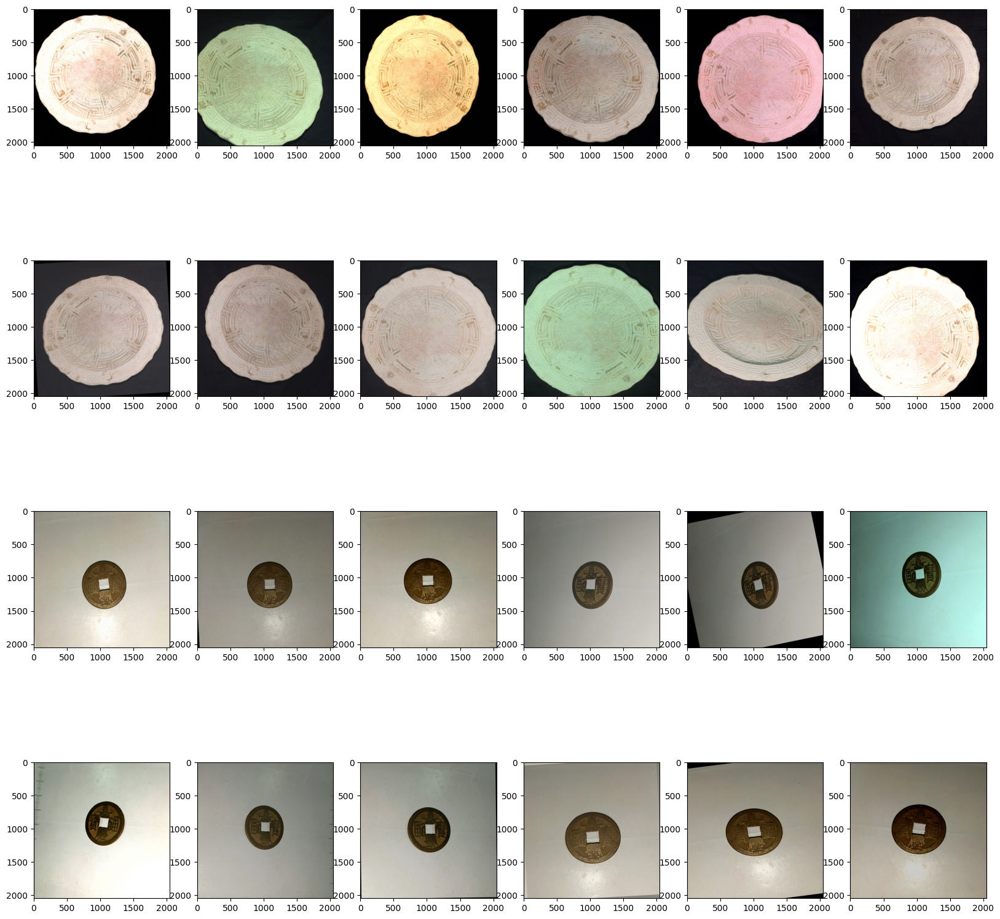

In [ ]:
# Visualize train set
keramik_cina_images = [os.path.join(keramik_cina_train_dir, fname) for fname in os.listdir(keramik_cina_train_dir)[:12]]
pis_bolong_images = [os.path.join(pis_bolong_train_dir, fname) for fname in os.listdir(pis_bolong_train_dir)[:12]]

W_grid = 6
L_grid = 4

fig, axes = plt.subplots(L_grid, W_grid, figsize = (20, 20))
axes = axes.ravel()

for i, img_path in enumerate(keramik_cina_images + pis_bolong_images):
    img = mpimg.imread(img_path)
    axes[i].imshow(img)

plt.subplots_adjust(hspace=0.3)

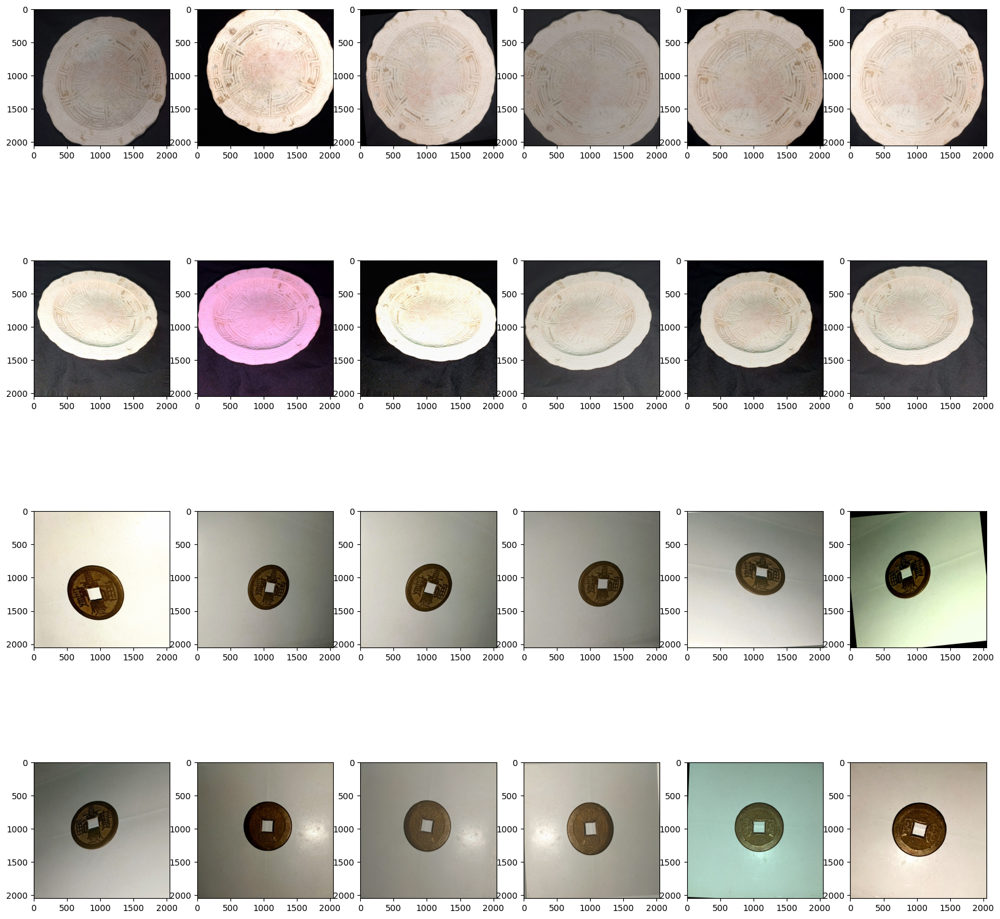

In [ ]:
# Visualize validation set
keramik_cina_images = [os.path.join(keramik_cina_val_dir, fname) for fname in os.listdir(keramik_cina_val_dir)[:12]]
pis_bolong_images = [os.path.join(pis_bolong_val_dir, fname) for fname in os.listdir(pis_bolong_val_dir)[:12]]

W_grid = 6
L_grid = 4

fig, axes = plt.subplots(L_grid, W_grid, figsize = (20, 20))
axes = axes.ravel()

for i, img_path in enumerate(keramik_cina_images + pis_bolong_images):
    img = mpimg.imread(img_path)
    axes[i].imshow(img)

plt.subplots_adjust(hspace=0.3)

In [ ]:
# Split dataset to train and validation set
"""
def create_train_test_dirs(base_dir):
  train_cepuk_dir = os.makedirs(os.path.join(base_dir,'training/Cepuk'))
  train_keramik_cina_dir = os.makedirs(os.path.join(base_dir,'training/Keramik Cina'))
  train_pis_bolong_dir = os.makedirs(os.path.join(base_dir,'training/Pis Bolong'))

  val_cepuk_dir = os.makedirs(os.path.join(base_dir,'validation/Cepuk'))
  val_keramik_cina_dir = os.makedirs(os.path.join(base_dir,'validation/Keramik Cina'))
  val_pis_bolong_dir = os.makedirs(os.path.join(base_dir,'validation/Pis Bolong'))

  test_cepuk_dir = os.makedirs(os.path.join(base_dir,'testing/Cepuk'))
  test_keramik_cina_dir = os.makedirs(os.path.join(base_dir,'testing/Keramik Cina'))
  test_pis_bolong_dir = os.makedirs(os.path.join(base_dir,'testing/Pis Bolong'))

try:
  create_train_test_dirs('./data/augmented_v3')
except FileExistsError:
  print('There some error here!')
"""

In [ ]:
# Split data
"""
def split_data(SOURCE, TRAINING, VALIDATION, TESTING, SPLIT_SIZE):
  file_to_copy = os.listdir(SOURCE)

  for f in file_to_copy:
    if os.path.getsize(os.path.join(SOURCE, f)) == 0:
      print(f"{f} is zero length, so ignoring.")
      file_to_copy.remove(f)

  length_of_training = int(len(file_to_copy) * SPLIT_SIZE)
  training_data = random.sample(file_to_copy, length_of_training)

  remaining_files = list(set(file_to_copy) - set(training_data))

  length_of_validation = int(len(remaining_files) * 0.5)
  validation_data = random.sample(remaining_files, length_of_validation)

  testing_data = list(set(remaining_files) - set(validation_data))

  for f in training_data :
    shutil.copyfile(os.path.join(SOURCE, f),os.path.join(TRAINING,f))

  for f in validation_data :
    shutil.copyfile(os.path.join(SOURCE, f),os.path.join(VALIDATION,f))

  for f in testing_data :
    shutil.copyfile(os.path.join(SOURCE, f), os.path.join(TESTING,f))
"""

In [ ]:
"""
base_dir = './data/augmented_v3/'

train_dir = os.path.join(base_dir, 'training')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'testing')

train_cepuk_dir = os.path.join(train_dir, "Cepuk/")
val_cepuk_dir = os.path.join(validation_dir, "Cepuk/")
test_cepuk_dir = os.path.join(test_dir, "Cepuk/")

train_keramik_cina_dir = os.path.join(train_dir, "Keramik Cina/")
val_keramik_cina_dir = os.path.join(validation_dir, "Keramik Cina/")
test_keramik_cina_dir = os.path.join(test_dir, "Keramik Cina/")

train_pis_bolong_dir = os.path.join(train_dir, "Pis Bolong/")
val_pis_bolong_dir = os.path.join(validation_dir, "Pis Bolong/")
test_pis_bolong_dir = os.path.join(test_dir, "Pis Bolong/")

# Empty directories in case run this cell multiple times
if len(os.listdir(train_cepuk_dir)) > 0:
  for file in os.scandir(train_cepuk_dir):
    os.remove(file.path)
if len(os.listdir(train_keramik_cina_dir)) > 0:
  for file in os.scandir(train_keramik_cina_dir):
    os.remove(file.path)
if len(os.listdir(train_pis_bolong_dir)) > 0:
  for file in os.scandir(train_pis_bolong_dir):
    os.remove(file.path)
if len(os.listdir(val_cepuk_dir)) > 0:
  for file in os.scandir(val_cepuk_dir):
    os.remove(file.path)
if len(os.listdir(val_keramik_cina_dir)) > 0:
  for file in os.scandir(val_keramik_cina_dir):
    os.remove(file.path)
if len(os.listdir(val_pis_bolong_dir)) > 0:
  for file in os.scandir(val_pis_bolong_dir):
    os.remove(file.path)
if len(os.listdir(test_cepuk_dir)) > 0:
  for file in os.scandir(test_cepuk_dir):
    os.remove(file.path)
if len(os.listdir(test_keramik_cina_dir)) > 0:
  for file in os.scandir(test_keramik_cina_dir):
    os.remove(file.path)
if len(os.listdir(test_pis_bolong_dir)) > 0:
  for file in os.scandir(test_pis_bolong_dir):
    os.remove(file.path)

# Define proportion of images used for training
split_size = 0.7

original_cepuk_dir = os.path.join(base_dir, 'Cepuk')
original_keramik_cina_dir = os.path.join(base_dir, 'Keramik Cina')
original_pis_bolong_dir = os.path.join(base_dir, 'Pis Bolong')

split_data(original_cepuk_dir, train_cepuk_dir, val_cepuk_dir, test_cepuk_dir, split_size)
split_data(original_keramik_cina_dir, train_keramik_cina_dir, val_keramik_cina_dir, test_keramik_cina_dir, split_size)
split_data(original_pis_bolong_dir, train_pis_bolong_dir, val_pis_bolong_dir, test_pis_bolong_dir, split_size)


# Check that the number of images matches the expected output
print(f"\n\nThere are {len(os.listdir(train_cepuk_dir))} images of Cepuk for training")
print(f"There are {len(os.listdir(train_keramik_cina_dir))} images of Keramik Cina for training")
print(f"There are {len(os.listdir(train_pis_bolong_dir))} images of Pis Bolong for training\n")
print(f"There are {len(os.listdir(val_cepuk_dir))} images of Cepuk validation")
print(f"There are {len(os.listdir(val_keramik_cina_dir))} images of Keramik Cina for validation")
print(f"There are {len(os.listdir(val_pis_bolong_dir))} images of Pis Bolong for validation\n")
print(f"There are {len(os.listdir(test_cepuk_dir))} images of Cepuk testing")
print(f"There are {len(os.listdir(test_keramik_cina_dir))} images of Keramik Cina for testing")
print(f"There are {len(os.listdir(test_pis_bolong_dir))} images of Pis Bolong for testing")
"""

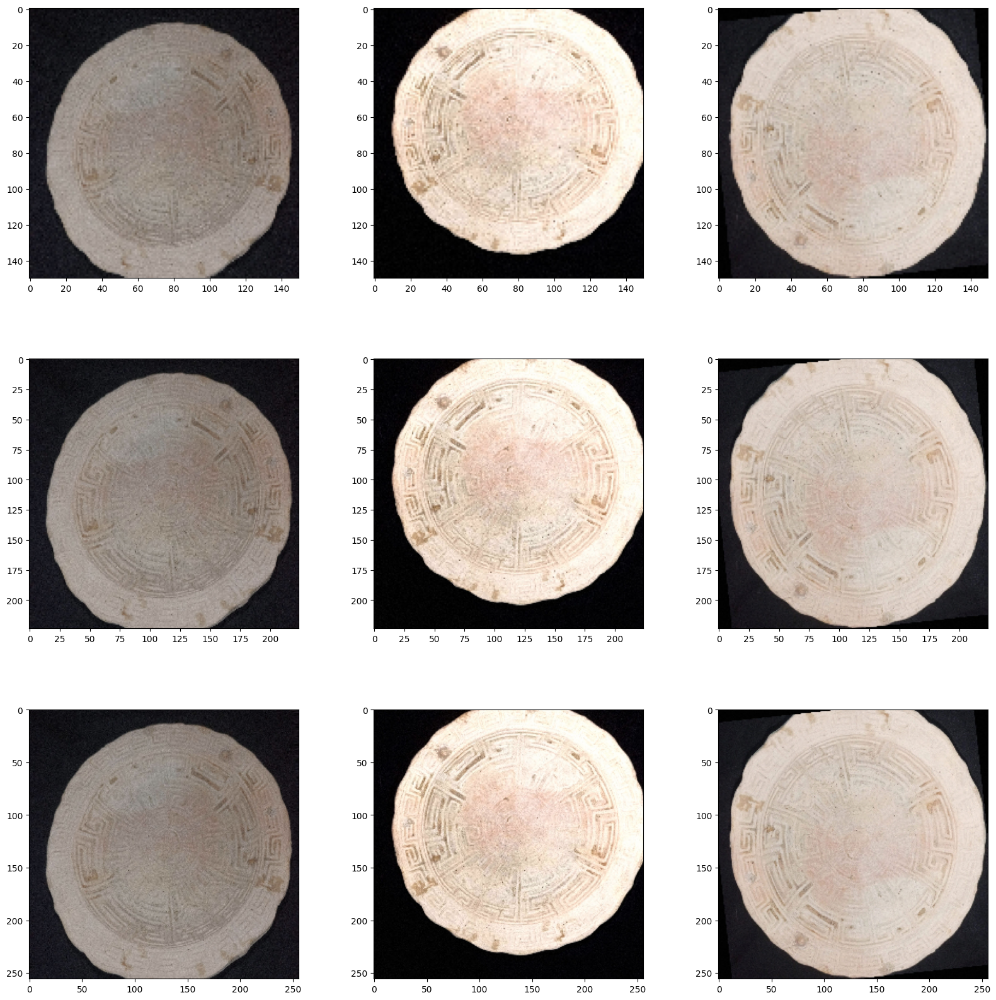

In [ ]:
# Visualize images in size 150 x 150, 224 x 224, and 256 x 256
W_grid = 3
L_grid = 3

fig, axes = plt.subplots(L_grid, W_grid, figsize=(20,20))
axes = axes.ravel()

sample_keramik_cina_1 = [load_img(keramik_cina_images[i], target_size=(150, 150)) for i in range(0, 3)]
sample_keramik_cina_2 = [load_img(keramik_cina_images[i], target_size=(224, 224)) for i in range(0, 3)]
sample_keramik_cina_3 = [load_img(keramik_cina_images[i], target_size=(256, 256)) for i in range(0, 3)]

for i, img in enumerate(sample_keramik_cina_1 + sample_keramik_cina_2 + sample_keramik_cina_3):
    axes[i].imshow(img)

plt.subplots_adjust(hspace=0.3)

In [ ]:
# Prepare image generator
base_dir = './data/artifact'
training_dir = os.path.join(base_dir, 'training')
training_datagen = ImageDataGenerator(
    rescale=1.0/255.0)

train_generator = training_datagen.flow_from_directory(
	  training_dir,
	  target_size=(224, 224),
	  class_mode='binary',
    color_mode='rgb'
)

validation_dir = os.path.join(base_dir, 'validation')
validation_datagen = ImageDataGenerator(rescale=1.0/255.0)

validation_generator = validation_datagen.flow_from_directory(
	  validation_dir,
	  target_size=(224, 224),
	  class_mode='binary',
    color_mode='rgb'
)

Found 1260 images belonging to 2 classes.
Found 540 images belonging to 2 classes.


In [ ]:
# Create model
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 28, 28, 128)       0

1/1 [==============================] - 0s 365ms/step


<ipython-input-23-d674d545f15c>:31: RuntimeWarning: invalid value encountered in divide
  x /= x.std ()


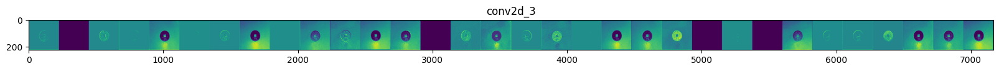

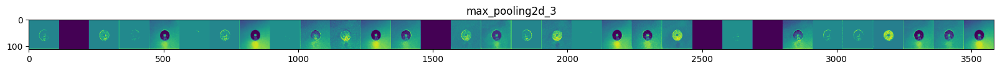

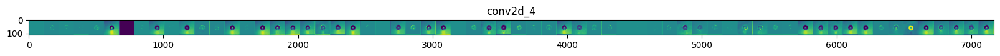

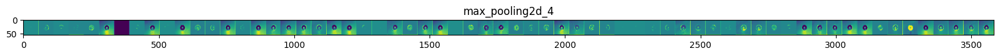

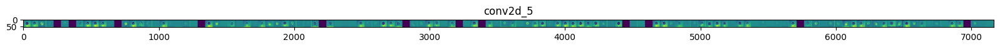

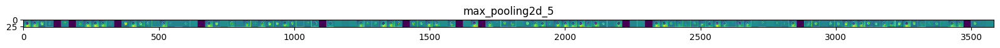

In [ ]:
# Visualize how image features extract in each layer
successive_outputs = [layer.output for layer in model.layers]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

keramik_cina_images = [os.path.join('./data/artifact/training/Keramik_Cina', os.listdir('./data/artifact/training/Keramik_Cina')[0])]
pis_bolong_images = [os.path.join('./data/artifact/training/Pis_Bolong', os.listdir('./data/artifact/training/Pis_Bolong')[0])]

sample_images_path = keramik_cina_images + pis_bolong_images

img_path = random.choice(sample_images_path)
img = load_img(img_path, target_size=(224, 224))
x   = img_to_array(img)
x   = x.reshape((1,) + x.shape)

x /= 255.0

successive_feature_maps = visualization_model.predict(x)

layer_names = [layer.name for layer in model.layers]

for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:
    n_features = feature_map.shape[-1]
    size       = feature_map.shape[ 1]

    display_grid = np.zeros((size, size * n_features))

    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      display_grid[:, i * size : (i + 1) * size] = x

    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )

In [ ]:
# Compile model
model.compile(loss = 'binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=1e-03), metrics=['accuracy'])

In [ ]:
# Create early stopping
stop_training = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

In [ ]:
# Train model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    callbacks=[stop_training]
)

Epoch 1/10
39/39 [==============================] - 256s 7s/step - loss: 0.1510 - accuracy: 0.9650 - val_loss: 5.5177e-05 - val_accuracy: 1.0000
Epoch 2/10
39/39 [==============================] - 61s 2s/step - loss: 6.6329e-06 - accuracy: 1.0000 - val_loss: 2.3185e-04 - val_accuracy: 1.0000
Epoch 3/10
39/39 [==============================] - 57s 1s/step - loss: 1.1247e-07 - accuracy: 1.0000 - val_loss: 3.5488e-04 - val_accuracy: 1.0000
Epoch 4/10
39/39 [==============================] - 59s 2s/step - loss: 9.6829e-08 - accuracy: 1.0000 - val_loss: 3.7720e-04 - val_accuracy: 1.0000
Epoch 5/10
39/39 [==============================] - 60s 2s/step - loss: 9.0961e-08 - accuracy: 1.0000 - val_loss: 4.0431e-04 - val_accuracy: 1.0000
Epoch 6/10
39/39 [==============================] - 61s 2s/step - loss: 8.5191e-08 - accuracy: 1.0000 - val_loss: 4.2913e-04 - val_accuracy: 1.0000


Text(0.5, 1.0, 'Train - Accuracy')

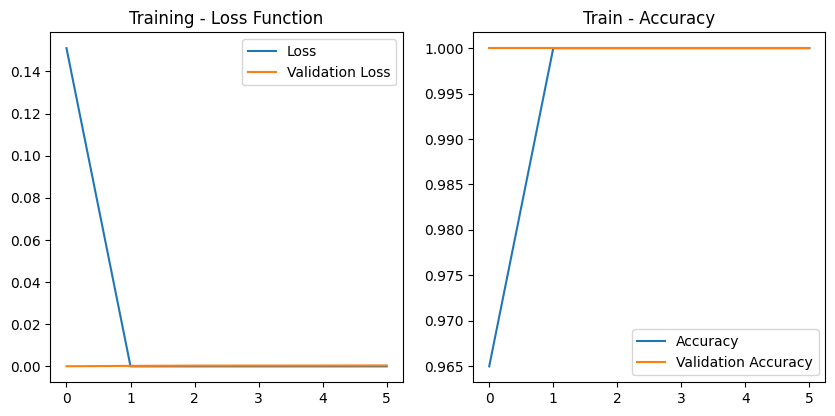

In [ ]:
# Visualize loss and accuracy
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Training - Loss Function')

plt.subplot(2, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Train - Accuracy')

1/1 [==============================] - 0s 18ms/step


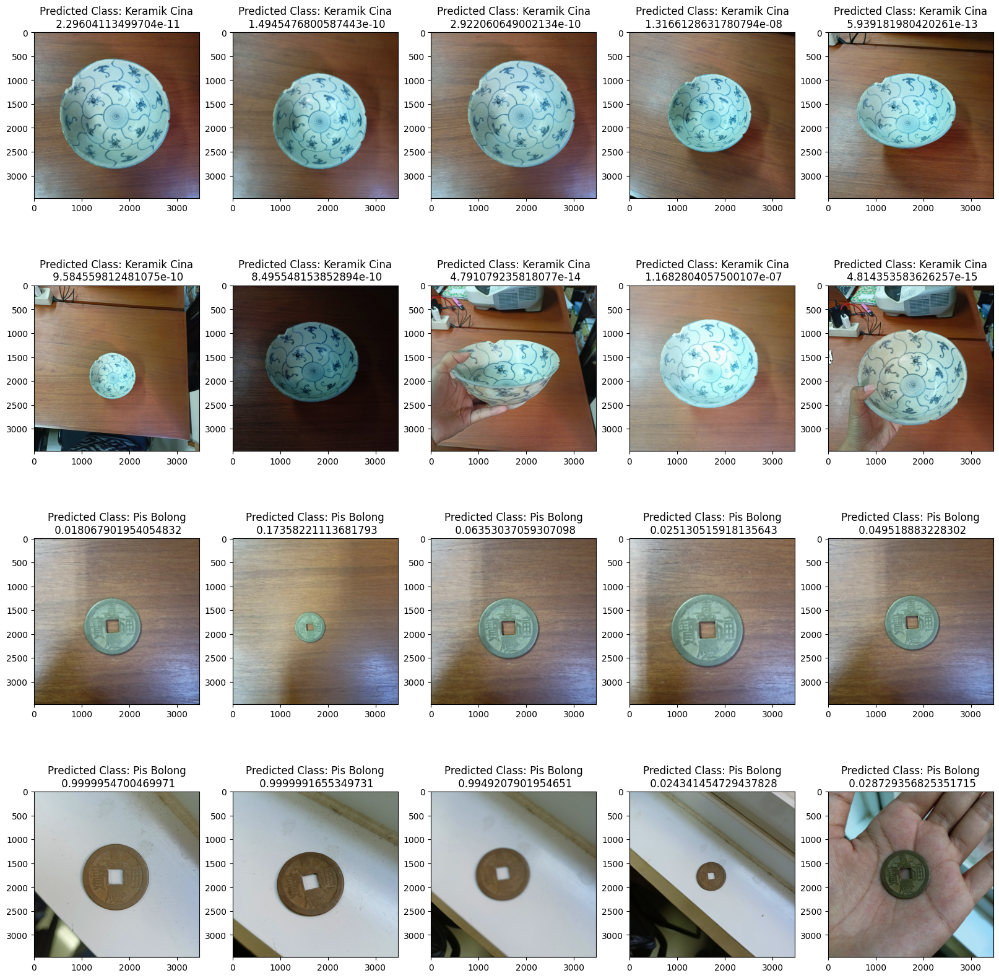

In [ ]:
# Testing
W_grid = 5
L_grid = 4

class_names = list(train_generator.class_indices.keys())

keramik_sample = [os.path.join('./data/New Data/Keramik Cina/', fname) for fname in os.listdir('./data/New Data/Keramik Cina')[:10]]
pis_sample = [os.path.join('./data/New Data/Pis Bolong/', fname) for fname in os.listdir('./data/New Data/Pis Bolong')[:10]]

test_data_path = keramik_sample + pis_sample

fig, axes = plt.subplots(L_grid, W_grid, figsize = (20, 20))
axes = axes.ravel()

for i, img_path in enumerate(test_data_path):
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0
    x = np.expand_dims(x, axis=0)

    images = np.vstack([x])
    classes = model.predict(images)
    predicted_name = ''

    if classes[0][0] > 1e-05:
      predicted_name = 'Pis Bolong'
    else:
      predicted_name = 'Keramik Cina'

    img = mpimg.imread(img_path)
    axes[i].imshow(img)
    axes[i].set_title('Predicted Class: {}\n {}'.format(predicted_name, classes[0][0]))

plt.subplots_adjust(hspace=0.3)

1/1 [==============================] - 0s 19ms/step


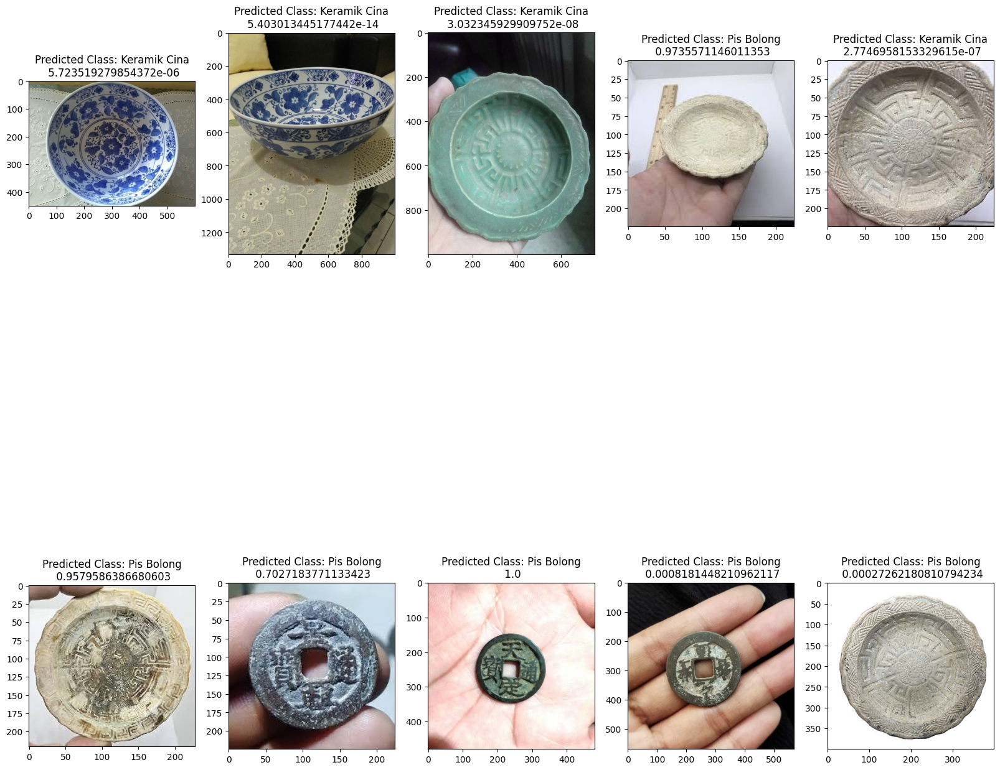

In [ ]:
# Testing
W_grid = 5
L_grid = 2

class_names = list(train_generator.class_indices.keys())

test_data_path = [os.path.join('./data/Testing_Data/Artifact_Dataset', fname) for fname in os.listdir('./data/Testing_Data/Artifact_Dataset')]

fig, axes = plt.subplots(L_grid, W_grid, figsize = (20, 20))
axes = axes.ravel()

for i, img_path in enumerate(test_data_path):
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0
    x = np.expand_dims(x, axis=0)

    images = np.vstack([x])
    classes = model.predict(images)
    predicted_name = ''

    if classes[0][0] > 1e-05:
      predicted_name = 'Pis Bolong'
    else:
      predicted_name = 'Keramik Cina'

    img = mpimg.imread(img_path)
    axes[i].imshow(img)
    axes[i].set_title('Predicted Class: {}\n {}'.format(predicted_name, classes[0][0]))

In [ ]:
# Save model to gdrive
model.save('./model/artiquest-object-identifier-2-v5.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
